In [1]:
import numpy as np;  # NumPy package for arrays, random number generation, etc
import matplotlib.pyplot as plt  # for plotting
import matplotlib.cm as cm
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
from scipy.spatial import Voronoi, voronoi_plot_2d, distance #for voronoi tessellation

np.random.seed(9012022)

In [2]:
# min/max values for colorscale
minima = 0
maxima = 1

k = 10 # Alters the size of the domain [10]
subclones = 100 # Higher the number, the more the mosaicism [100]
clone_dist = 2. # Higher the number the more the homogenous [2]

# Point process parameters
lambda0 = 10;  # intensity (ie mean density) of the Poisson process

In [3]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

def voronoi_sim(k=10, lambda0=10):
    # Simulation window parameters
    xMin = 0;
    xMax = 4.56*k;
    yMin = 0;
    yMax = 2.56*k;
    # rectangle dimensions
    xDelta = xMax - xMin; #width
    yDelta = yMax - yMin #height
    areaTotal = xDelta * yDelta; #area of similation window

    # Simulate a Poisson point process
    numbPoints = np.random.poisson(lambda0 * areaTotal);  # Poisson number of points
    xx = xDelta * np.random.uniform(0, 1, numbPoints) + xMin;  # x coordinates of Poisson points
    yy = yDelta * np.random.uniform(0, 1, numbPoints) + yMin;  # y coordinates of Poisson points

    xxyy=np.stack((xx,yy), axis=1); #combine x and y coordinates
    ##Perform Voroin tesseslation using built-in function
    voronoiData=Voronoi(xxyy);
    return( voronoiData )

def voronoi_plot_funcs(voronoiData, colormapper, subclones=100, clone_dist=2, output="img.png", completely_random=False, k=10, std_euc_dist_k6 = 5.95):
    # Simulation window parameters
    xMax = 4.56*k;
    yMax = 2.56*k;
    
    fig, axs = plt.subplots(1,1,figsize=(xMax, yMax), dpi=300)

    voronoi_plot_2d(voronoiData, ax = axs, show_points=False,show_vertices=False, line_width=0.5, line_alpha=1.);

    if completely_random==False:
        center_x = np.round(np.linspace(0,voronoiData.points.shape[0]-1, subclones),0)
    
        allDists = {}
        for k, center_of_clone in enumerate(center_x):
            closeDists = []
            for point in range(0,voronoiData.points.shape[0]):
                a = voronoiData.points[int(center_of_clone),]
                b = voronoiData.points[point,]
                closeDists.append(distance.euclidean(a, b))
            allDists.update({ k : np.where( np.asarray(closeDists) < (std_euc_dist_k6*clone_dist) * np.random.random_sample() )[0]})
    
        colorsToGrab = np.random.rand(1, len(list(allDists.keys())))[0]

    for r in range(len(voronoiData.point_region)): # r is the idx of the point_region
        region = voronoiData.regions[voronoiData.point_region[r]]
    
        if not -1 in region:
            polygon = [voronoiData.vertices[i] for i in region]

            kFound = False
            if completely_random==False:
                for k in allDists:
                    if r in allDists[k]: # Found its neighborhood
                        kFound = True
                        plt.fill(*zip(*polygon), color=colormapper.to_rgba(colorsToGrab[k]))
                        break
            if kFound == False or completely_random==True: # No Neighborhood, give it a random color
                plt.fill(*zip(*polygon), color=colormapper.to_rgba(np.random.rand(1)))
    
    axs.spines['top'].set_visible(False)
    axs.spines['right'].set_visible(False)
    axs.spines['left'].set_visible(False)
    axs.spines['bottom'].set_visible(False)
    axs.get_xaxis().set_visible(False)
    axs.get_yaxis().set_visible(False)
    plt.savefig(output) # Save Figure
    plt.show()
    
plt.close('all')  # close all figures
norm = mpl.colors.Normalize(vmin=minima, vmax=maxima, clip=True)

def get_stylized_plot(voronoi_out, cmap, colorbarRange, outfile, norm=norm, subclones=100, clone_dist=2, completely_random=True, k=10):    
    for i,tup in enumerate(colorbarRange):
        plotCmap = truncate_colormap(cmap, tup[0], tup[1])
        colormapper = cm.ScalarMappable(norm=norm, cmap=plotCmap)

        voronoi_plot_funcs(voronoi_out, colormapper, subclones=subclones, clone_dist=clone_dist, output="imgs/%s_%s.png"%(outfile, i), completely_random=completely_random, k=k)

In [ ]:
# fig, ax = plt.subplots(figsize=(10, 1))
# fig.subplots_adjust(bottom=0.5)

# cmap = truncate_colormap(cm.ocean, 0.8,0.95) # Ocean for the sky is 0.4 to 1.0 overall
# (0.8,0.95),(0.7,0.9),(0.6,0.8),(0.5,0.7),(0.4,0.6)
# fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
#              cax=ax, orientation='horizontal', label='Some Units')
# plt.show()

In [4]:
# # For the sky gradient
# k0=10 # Use 10 for final one
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# clone_dist = 0.05
# subclones = 500
# get_stylized_plot(voronoi_out, cm.ocean, colorbarRange=[(0.8,0.95),(0.7,0.9),(0.6,0.8),(0.5,0.7),(0.4,0.6)], outfile="sky", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [5]:
# # For moon and sun
# k0=4
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# subclones = 300
# clone_dist = 0.05
# get_stylized_plot(voronoi_out, cm.inferno, colorbarRange=[(0.7, 0.9)], outfile="sun", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# get_stylized_plot(voronoi_out, cm.binary, colorbarRange=[(0.,.1)], outfile="moon", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [6]:
# # For cacti and plants
# k0=6
# lambda0=20.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# # Only run again if you change k or lambda
# # get_stylized_plot(voronoi_out, cm.Greens, colorbarRange=[(0.5, 0.7)], outfile="cacti", completely_random=True, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# subclones = 100
# clone_dist = 0.1
# get_stylized_plot(voronoi_out, cm.Greens, colorbarRange=[(0.5, 0.7)], outfile="cacti_mosaic", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# clone_dist = 0.2
# get_stylized_plot(voronoi_out, cm.Greens, colorbarRange=[(0.5, 0.7)], outfile="cacti_mosaic_high", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# clone_dist=0.3
# get_stylized_plot(voronoi_out, cm.Greens, colorbarRange=[(0.5, 0.7)], outfile="cacti_mosaic_highest", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [7]:
# k0=6
# lambda0=20.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# clone_dist = 0.2
# subclones = 100
# get_stylized_plot(voronoi_out, cm.terrain, colorbarRange=[(0.5, 1.0)], outfile="plants", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [8]:
# # For distant mountains
# k0=6
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# get_stylized_plot(voronoi_out, cm.terrain, colorbarRange=[(0.7, 0.9)], outfile="mountains", completely_random=True, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [9]:
# # For coyotes
# k0=6
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# subclones = 100
# clone_dist = 0.1
# get_stylized_plot(voronoi_out, cm.binary, colorbarRange=[(0.3, 0.8)], outfile="animals", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# subclones = 300
# clone_dist = 0.15
# get_stylized_plot(voronoi_out, cm.binary, colorbarRange=[(0.3, 0.8)], outfile="animals_2", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [10]:
# # For a walking human
# k0=6
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# subclones=50
# clone_dist=0.1
# get_stylized_plot(voronoi_out, cm.nipy_spectral, colorbarRange=[(0.2, 1.)], outfile="human", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# subclones=150
# clone_dist=0.15
# get_stylized_plot(voronoi_out, cm.nipy_spectral, colorbarRange=[(0.2, 1.)], outfile="human_low", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# subclones=300
# clone_dist=0.15
# get_stylized_plot(voronoi_out, cm.nipy_spectral, colorbarRange=[(0.2, 1.)], outfile="human_medium", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# subclones=300
# clone_dist=0.2
# get_stylized_plot(voronoi_out, cm.nipy_spectral, colorbarRange=[(0.2, 1.)], outfile="human_high", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)

In [360]:
def voronoi_sim(k=10, lambda0=10):
    # Simulation window parameters
    xMin = 0;
    xMax = (1.2*5)*k;
    yMax = 1.2*k;
    yMin = 0;
    # rectangle dimensions
    xDelta = xMax - xMin; #width
    yDelta = yMax - yMin #height
    areaTotal = xDelta * yDelta; #area of similation window

    # Simulate a Poisson point process
    numbPoints = np.random.poisson(lambda0 * areaTotal);  # Poisson number of points
    xx = xDelta * np.random.uniform(0, 1, numbPoints) + xMin;  # x coordinates of Poisson points
    yy = yDelta * np.random.uniform(0, 1, numbPoints) + yMin;  # y coordinates of Poisson points

    xxyy=np.stack((xx,yy), axis=1); #combine x and y coordinates
    ##Perform Voroin tesseslation using built-in function
    voronoiData=Voronoi(xxyy);
    return( voronoiData )

def voronoi_plot_funcs_growing_clone(voronoiData, cmap, subclones=100, clone_dist=2, output="img.png", completely_random=False, k=10, std_euc_dist_k6 = 5.95):
    # Simulation window parameters
    xMax = (1.2*5)*k;
    yMax = 1.2*k;
    
    fig, axs = plt.subplots(1,1, figsize=(xMax, yMax), dpi=300)

    voronoi_plot_2d(voronoiData, ax = axs, show_points=False,show_vertices=False, line_width=0.5, line_alpha=1.);

    if completely_random==False:
        center_x = np.round(np.linspace(0,voronoiData.points.shape[0]-1, subclones),0)
    
        allDists = {}
        for k, center_of_clone in enumerate(center_x):
            closeDists = []
            for point in range(0,voronoiData.points.shape[0]):
                a = voronoiData.points[int(center_of_clone),]
                b = voronoiData.points[point,]
                closeDists.append(distance.euclidean(a, b))
            allDists.update({ k : np.where( np.asarray(closeDists) < (std_euc_dist_k6*clone_dist) * np.random.random_sample() )[0]})
    
        colorsToGrab = np.random.rand(1, len(list(allDists.keys())))[0]
    
    gradient_step = yMax/4.
    for r in range(len(voronoiData.point_region)): # r is the idx of the point_region
        region = voronoiData.regions[voronoiData.point_region[r]]
    
        if not -1 in region:
            polygon = [voronoiData.vertices[i] for i in region]
            
            if polygon[0][1] < gradient_step * 1.:
                tup = (0.7,0.95)
            elif polygon[0][1] < gradient_step * 2.:
                tup = (0.6,0.9)
            elif polygon[0][1] < gradient_step * 3.:
                tup = (0.5,0.8)
            elif polygon[0][1] < gradient_step * 4.:
                tup = (0.4,0.7)
            elif polygon[0][1] < gradient_step * 5.:
                tup = (0.3,0.6)
            else:
                tup = (0.2,0.6)
                
            plotCmap = truncate_colormap(cmap, tup[0], tup[1])
            colormapper = cm.ScalarMappable(norm=norm, cmap=plotCmap)
            
            kFound = False
            if completely_random==False:
                for k in allDists:
                    if r in allDists[k]: # Found its neighborhood
                        kFound = True
                        plt.fill(*zip(*polygon), color=colormapper.to_rgba(colorsToGrab[k]))
                        break
            if kFound == False or completely_random==True: # No Neighborhood, give it a random color
                plt.fill(*zip(*polygon), color=colormapper.to_rgba(np.random.rand(1)))
    
    axs.spines['top'].set_visible(False)
    axs.spines['right'].set_visible(False)
    axs.spines['left'].set_visible(False)
    axs.spines['bottom'].set_visible(False)
    axs.get_xaxis().set_visible(False)
    axs.get_yaxis().set_visible(False)
    plt.savefig(output) # Save Figure
    plt.show()
    
plt.close('all')  # close all figures

def get_stylized_plot_growing_clone(voronoi_out, cmap, colorbarRange, outfile, norm=norm, subclones=100, clone_dist=2, completely_random=True, k=10):    
    for i,tup in enumerate(colorbarRange):
        voronoi_plot_funcs_growing_clone(voronoi_out, cmap, subclones=subclones, clone_dist=clone_dist, output="imgs/%s_%s.png"%(outfile, i), completely_random=completely_random, k=k)

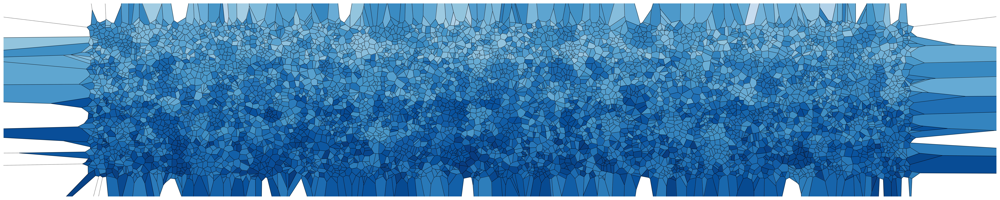

In [361]:
# # For the sky
# k0=6
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# subclones=300
# clone_dist=0.1
# get_stylized_plot_growing_clone(voronoi_out, cm.Blues, colorbarRange=[(0.2, 1.)], outfile="sky", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# # 1367 329

In [ ]:
# # For the sky
# k0=6
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# subclones=300
# clone_dist=0.1
# get_stylized_plot_growing_clone(voronoi_out, cm.Blues, colorbarRange=[(0.2, 1.)], outfile="sky", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# # 1367 329
# plt.close('all')  # close all figures

In [47]:
def voronoi_sim(k=10, lambda0=10):
    # Simulation window parameters
    xMin = 0;
    xMax = 4.56*k;
    yMin = 0;
    yMax = 2.56*k;
    # rectangle dimensions
    xDelta = xMax - xMin; #width
    yDelta = yMax - yMin #height
    areaTotal = xDelta * yDelta; #area of similation window

    # Simulate a Poisson point process
    numbPoints = np.random.poisson(lambda0 * areaTotal);  # Poisson number of points
    xx = xDelta * np.random.uniform(0, 1, numbPoints) + xMin;  # x coordinates of Poisson points
    yy = yDelta * np.random.uniform(0, 1, numbPoints) + yMin;  # y coordinates of Poisson points

    xxyy=np.stack((xx,yy), axis=1); #combine x and y coordinates
    ##Perform Voroin tesseslation using built-in function
    voronoiData=Voronoi(xxyy);
    return( voronoiData )

def voronoi_plot_funcs_growing_clone(voronoiData, cmap, subclones=100, clone_dist=2, output="img.png", completely_random=False, k=10, std_euc_dist_k6 = 5.95):
    # Simulation window parameters
    xMin = 0;
    xMax = 4.56*k;
    yMin = 0;
    yMax = 2.56*k;
    
    fig, axs = plt.subplots(1,1, figsize=(xMax, yMax), dpi=300)

    voronoi_plot_2d(voronoiData, ax = axs, show_points=False,show_vertices=False, line_width=0.5, line_alpha=1.);

    plotCmap = truncate_colormap(cmap, 0, 1.)
    colormapper = cm.ScalarMappable(norm=norm, cmap=plotCmap)
    
    n=4.
    gradient_step = xMax/n
    polygons_in_group = [[] for i in range(0,4)]
    for r in range(len(voronoiData.point_region)): # r is the idx of the point_region
        region = voronoiData.regions[voronoiData.point_region[r]]
        
        if not -1 in region:
            polygon = [voronoiData.vertices[i] for i in region]

            x_vals_mean = np.mean([polygon[i][0] for i in range(0, len(polygon))])
            
            if x_vals_mean < gradient_step * 1.:
                tup = (0.7,0.95)
                polygons_in_group[0].append(polygon)
            elif x_vals_mean < gradient_step * 2.:
                tup = (0.6,0.9)
                polygons_in_group[1].append(polygon)
            elif x_vals_mean < gradient_step * 3.:
                tup = (0.5,0.8)
                polygons_in_group[2].append(polygon)
            else:
                tup = (0.2,0.6)
                polygons_in_group[3].append(polygon)

    pC1 = LinearSegmentedColormap.from_list("", list(set(["#fc3f3f","#ff8585","#FFE6E3","#EDBA9D","#ff8585","#F7CFC3","#FFDDD4","#FFE6E3","#EDBA9D","#F7CFC3","#FFDDD4","#FFE6E3","#EDBA9D","#F7CFC3","#FFDDD4"])))
    pC2 = LinearSegmentedColormap.from_list("", list(set(["#fc3f3f","#ff8585","#FFE6E3","#EDBA9D","#ff8585","#F7CFC3","#FFDDD4","#FFE6E3","#EDBA9D","#F7CFC3","#FFDDD4","#f79872","#FFE6E3","#EDBA9D","#F7CFC3","#FFDDD4"])))
    pC3 = LinearSegmentedColormap.from_list("", list(set(["#fc3f3f","#ff8585","#FFE6E3","#EDBA9D","#F7CFC3","#FFDDD4","#FFE6E3","#f79872","#EDBA9D","#F7CFC3","#FFDDD4","#FFE6E3","#ff8585","#EDBA9D","#F7CFC3","#FFDDD4"])))
    pC4 = LinearSegmentedColormap.from_list("", list(set(["#fc3f3f","#ff8585","#FFDDD4","#FFE6E3","#EDBA9D","#F7CFC3","#FFDDD4","#FFE6E3","#ff8585","#EDBA9D","#fc6262","#F7CFC3","#FFDDD4"])))
    colormaps = [pC1, pC2, pC3, pC4]
    s = [50,100,100,300]
    clone_dist = [0.1,0.2,0.3,0.4]
    
    # Each group now contains polygons inside of the stratified areas
    for i, polygons in enumerate(polygons_in_group):
        center_x = np.round(np.linspace(0,len(polygons)-1, s[i]),0)

        allDists = {}
        for k, center_of_clone in enumerate(center_x):
            a = polygons[int(center_of_clone)][0]
            
            closeDists = []
            for point in range(0,len(polygons)):
                b = polygons[point][0]
                closeDists.append(distance.euclidean(a, b))
            allDists.update({ k : np.where( np.asarray(closeDists) < (std_euc_dist_k6*clone_dist[i]) * np.random.random_sample() )[0]})
        
        colorsToGrab = np.random.rand(1, len(list(allDists.keys())))[0]
        
        colormapper = cm.ScalarMappable(norm=norm, cmap=colormaps[i])
        
        for idx, poly in enumerate(polygons):
            kFound = False
            for k in allDists: # Loop over subclones
                if idx in allDists[k]:
                    kFound = True
                    plt.fill(*zip(*poly), color=colormapper.to_rgba(colorsToGrab[k]))
                    break
            if kFound == False: # No Neighborhood, give it a random color
                plt.fill(*zip(*poly), color=colormapper.to_rgba(np.random.rand(1)))

    axs.spines['top'].set_visible(False)
    axs.spines['right'].set_visible(False)
    axs.spines['left'].set_visible(False)
    axs.spines['bottom'].set_visible(False)
    axs.get_xaxis().set_visible(False)
    axs.get_yaxis().set_visible(False)
    plt.savefig(output) # Save Figure
    plt.show()
    
plt.close('all')  # close all figures

def get_stylized_plot_growing_clone(voronoi_out, cmap, colorbarRange, outfile, norm=norm, subclones=100, clone_dist=2, completely_random=True, k=10):    
    for i,tup in enumerate(colorbarRange):
        voronoi_plot_funcs_growing_clone(voronoi_out, cmap, subclones=subclones, clone_dist=clone_dist, output="imgs/%s_%s.png"%(outfile, i), completely_random=completely_random, k=k)

In [49]:
# # For the desert floor
# k0=10
# lambda0=25.
# voronoi_out = voronoi_sim(k=k0, lambda0=lambda0)
# subclones=300
# clone_dist=0.1
# get_stylized_plot_growing_clone(voronoi_out, cm.Blues, colorbarRange=[(0.2, 1.)], outfile="skin", completely_random=False, norm=norm, subclones=subclones, clone_dist=clone_dist, k=k0)
# # 1367 329
# plt.close('all')  # close all figures